In [1]:
import sys
sys.platform

'darwin'

In [98]:
import sys  
sys.path.insert(1, '../src')

from pathlib import Path, PureWindowsPath

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from skimage.morphology import local_maxima

from utils.tps_io import parse_tps

from scipy.optimize import linear_sum_assignment
from numbering.hungarian_umeyama import umeyama

from tqdm.auto import tqdm
tqdm.pandas()

In [43]:
PROJECT_ROOT = Path.cwd().parent

LOGS_ROOT = PROJECT_ROOT / 'out' / 'extraction'

MODEL_DIR = PROJECT_ROOT / 'data' / 'models' / 'best_model'

METADATAS_OUT = PROJECT_ROOT / 'data' / 'annotations' / 'terrain.csv'
LANDMARKS_OUT = PROJECT_ROOT / 'data' / 'annotations' / 'terrain.tps'

print(f'Racine du projet : {PROJECT_ROOT}')

Racine du projet : /Users/superbg/Documents/Jules/IEES/idmybee


## Données Tancrède

In [3]:
tps_tancrede = '../data/annotations/tancrede.tps'
specimens, _ = parse_tps(tps_tancrede)

In [4]:
ds = []
records = []

for spec in specimens:
    img_path = spec.image_path

    name =  Path(img_path).stem
    app = name.split('_')[-1]

    tmp = img_path.split("/")
    espece = tmp[-3].split('_')[-1]
    caste = tmp[-2]

    ds.append(
        {"name": name, "espece": espece, "caste": caste, "device": app}
    )

    records.append({
        "landmarks": spec.landmarks[2:5,:],
        "image_path": img_path,
        "specimen_id": spec.sid,
    })

df = pd.DataFrame(ds)
df = df.drop(df[df.espece == "terrain"].index)
df.to_csv('../data/annotations/tancrede.csv', index_label="id")

In [28]:
specimens[0].landmarks.shape

(19, 2)

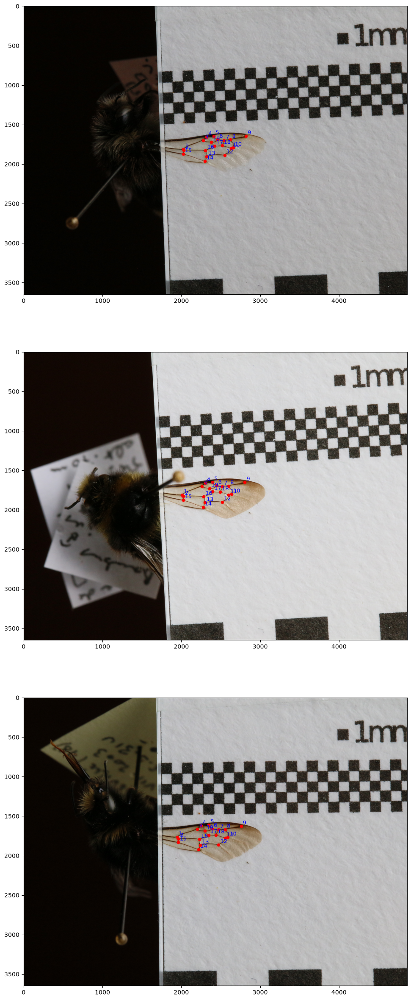

In [ ]:
n = 3
fig, axes = plt.subplots(n, 1, figsize=(15, 10*n))

for i, spec in enumerate(specimens[:n]):
    image = cv2.imread(PROJECT_ROOT / spec.image_path)
    h, w = image.shape[:2]

    landmarks = spec.landmarks.copy()
    landmarks[:, 1] = h - landmarks[:, 1]

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,0], landmarks[:,1], 20, 'r')

    for j, (x, y) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")

plt.show()

## Modèle Gabriel

In [44]:
orga_wings = pd.read_csv(LOGS_ROOT / 'organized_wings_log.csv')
terr_wings = pd.read_csv(LOGS_ROOT / 'terrain_wings_log.csv')

In [45]:
def get_image(row):
    split = row.image.split('_')
    if len(split) < 4:
        return row.image
    return row.image[:-2]

idmb = pd.read_csv(PROJECT_ROOT / 'data' / 'csv' / 'bourdon_IDMB.csv')
idmb.rename(columns={"Numéro d'inventaire": 'image', 'sp': 'espece'}, inplace=True)
idmb['espece'] = idmb["espece"].str.lower()
idmb = idmb.set_index("image")["espece"]

valids = terr_wings.loc[terr_wings.status == 'OK'].reset_index()
valids['image'] = valids.apply(get_image, axis=1)
valids = valids.join(idmb, on='image')[['image', 'espece', 'output_path']]
valids['caste'] = '_'
valids['device'] = 'D1'
valids[["image", "espece", "caste", "device"]].to_csv(METADATAS_OUT, index_label="id") 

In [46]:
valids.shape

(289, 5)

In [ ]:
# def fix_image(row):
#     return Path(row["image"]).stem

# def get_species(row):
#     try:
#         sp = row["input_path"].split('\\')[-3].split('_')[1]
#     except:
#         sp = row["input_path"].split('\\')[-3]
#     return sp

# def get_caste(row):
#     return row["input_path"].split('\\')[-2]

# def get_device(row):
#     return row["image"].split('_')[-1]

# valids = orga_wings.loc[orga_wings.status == 'OK']
# valids["image"] = valids.apply(fix_image, axis=1)
# valids["espece"] = valids.apply(get_species, axis=1)
# valids["caste"] = valids.apply(get_caste, axis=1)
# valids["device"] = valids.apply(get_device, axis=1)

# # unkown = valids[~valids.caste.isin(["male", "queen", "worker"])]
# valids = valids[valids.caste.isin(["male", "queen", "worker"])].reset_index()
# # valids[["image", "espece", "caste", "device"]].to_csv(METADATAS_OUT, index_label="id") 

In [47]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

model_name = "UNet_150_epoch_lr=0.001_seed=58_func=pow_param=30"
model_load = torch.load(MODEL_DIR / (model_name + '.pth'),
                        weights_only=False, map_location=device)
model_load.to(device)
model_load.eval()

print("using", device)

using cpu


In [49]:
records = []
total = valids.shape[0]

for i, row in tqdm(valids.iterrows(), total=total):
    path = PROJECT_ROOT / row.output_path

    crop = cv2.imread(path)
    crop = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)

    crop_t = torch.Tensor(crop.transpose(2,0,1)/255).unsqueeze(0)
    crop_t = crop_t.to(device)

    output = model_load(crop_t).cpu().squeeze(0).detach().numpy().transpose(1,2,0)
    output = output.squeeze(axis = 2)

    maximas = np.argwhere(local_maxima(output) == True)
    
    scores = np.array([output[pt[0],pt[1]] for pt in maximas])
    sorter = np.argsort(scores)
    
    maximas = maximas[sorter,:]
    maximas = maximas[-18:,:]

    records.append({
        "landmarks": maximas,
        "image_path": path,
        "specimen_id": i,
    })

100%|██████████| 289/289 [00:30<00:00,  9.62it/s]


In [50]:
with open(LANDMARKS_OUT, "w", encoding="utf-8") as f:
    for rec in records:
        lm = rec["landmarks"]
        f.write(f"LM={len(lm)}\n")
        for y, x in lm:
            f.write(f"{x:.4f} {y:.4f}\n")
        f.write(f"IMAGE={rec['image_path']}\n")
        f.write(f"ID={rec['specimen_id']}\n")

In [51]:
sample_indices = np.random.choice(total, size=min(10, total), replace=False)

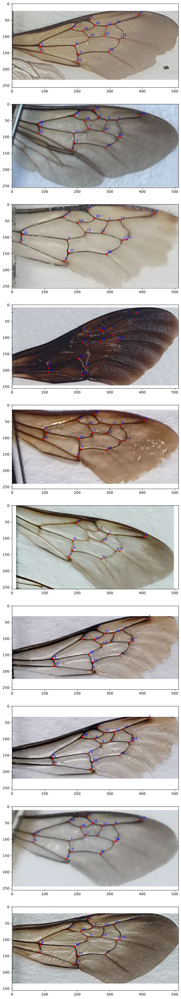

In [52]:
fig, axes = plt.subplots(10, 1, figsize=(10, 50))

for i, idx in enumerate(sample_indices):
    d = records[idx]
    
    image = cv2.imread(d["image_path"])
    landmarks = d["landmarks"]

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,1], landmarks[:,0], 10, 'r')

    for j, (y, x) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")

plt.show()

## Numérotation

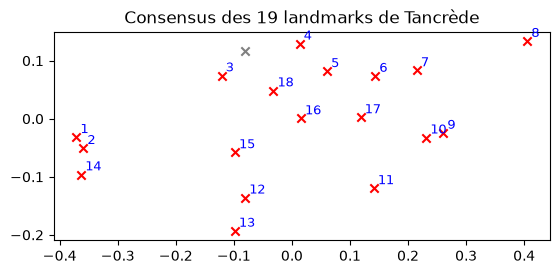

In [217]:
from utils.gpa import gpagen

tancrede_path = '../data/annotations/tancrede.tps'

specimens, _ = parse_tps(tancrede_path, strict=False)
specimens = [s for s in specimens if s.n_points == 19]
consensus = gpagen([s.landmarks for s in specimens]).mean_shape

zones = np.delete(consensus, 3, axis=0)

plt.scatter(zones[:,0], zones[:,1], color="red", marker="x")
plt.scatter(consensus[3,0], consensus[3,1], color="grey", marker="x")

for j, (x, y) in enumerate(zones):
    plt.annotate(str(j + 1), (x, y), color="blue", fontsize=9, xytext=(3, 3), textcoords="offset points")

plt.gca().set_aspect("equal", adjustable="box")
plt.title("Consensus des 19 landmarks de Tancrède")
plt.show()

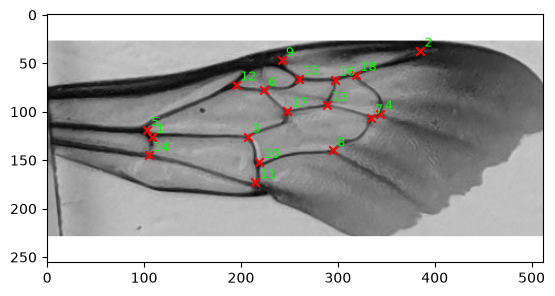

In [245]:
s = records[100]
points = s["landmarks"]
# points = np.flip(s["landmarks"], axis=1)

img = cv2.cvtColor(cv2.imread(s["image_path"]), cv2.COLOR_BGR2RGB)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), cmap="gray")

plt.scatter(points[:,1], points[:,0], color="red", marker="x")

for j, (x, y) in enumerate(points):
    plt.annotate(str(j + 1), (y, x), color="lime", fontsize=9, xytext=(3, 3), textcoords="offset points")

plt.gca().set_aspect("equal", adjustable="box")
plt.show()

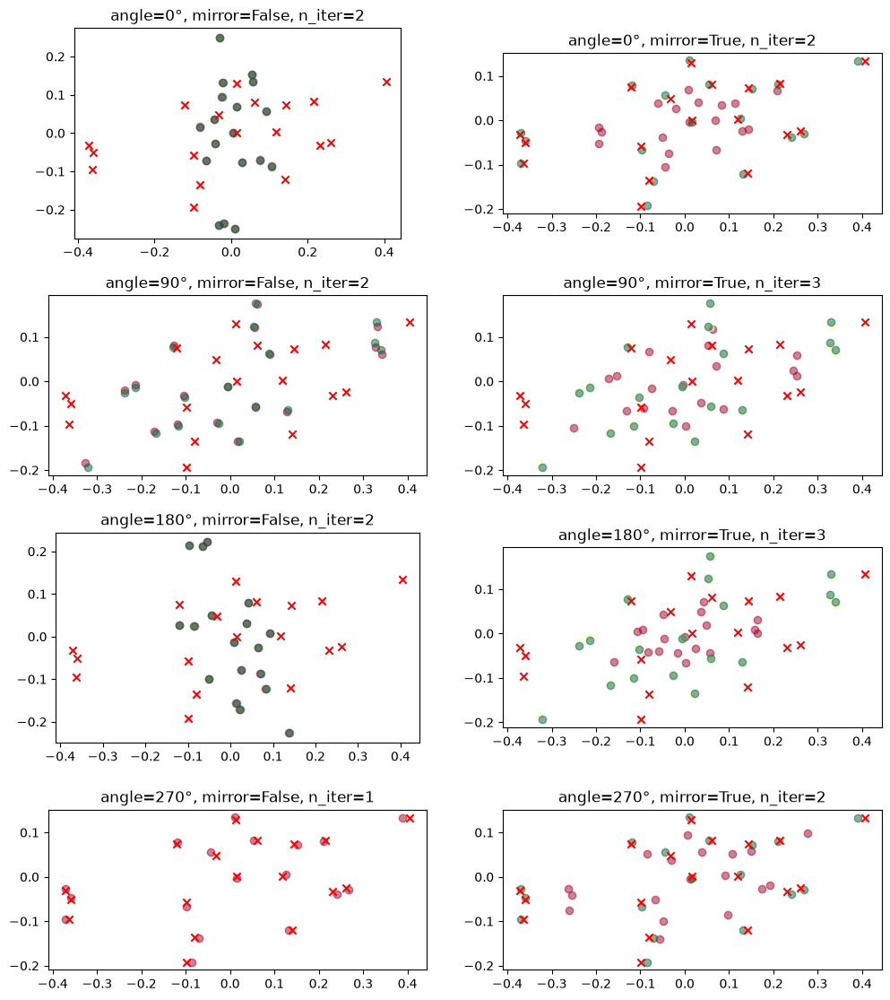

In [246]:
pts0 = points - points.mean(axis=0)
best = None

_, axes = plt.subplots(4, 2, figsize=(12, 14))
cmap = plt.get_cmap("RdYlGn")

# partir de la distance la plus grande entre les points

for i, angle in enumerate((0, 90, 180, 270)):
    th = np.deg2rad(angle)
    rot0 = np.array([[np.cos(th), -np.sin(th)], [np.sin(th), np.cos(th)]])

    for j, mirror in enumerate((False, True)):
        mir = np.array([[-1, 0], [0, 1]]) if mirror else np.eye(2)
        cur = pts0 @ (rot0 @ mir).T
        assign_prev = None

        iters = []

        for _ in range(20):
            cost = ((cur[:, None, :] - zones[None, :, :]) ** 2).sum(axis=2)
            row_ind, col_ind = linear_sum_assignment(cost)
            assign = col_ind[np.argsort(row_ind)]

            if assign_prev is not None and np.array_equal(assign, assign_prev):
                break

            assign_prev = assign
            R, scale, t = umeyama(pts0, zones[assign])
            cur = scale * (pts0 @ R.T) + t

            iters.append(cur)

        for k, c in enumerate(iters):
            axes[i, j].scatter(c[:,0], c[:,1], color=cmap(k / max(len(iters) - 1, 1)), marker="o", alpha=0.5)
        
        final_cost = ((cur - zones[assign]) ** 2).sum(axis=1).mean()

        axes[i, j].scatter(zones[:,0], zones[:,1], color="red", marker="x")
        axes[i, j].set_title(f"angle={angle}°, mirror={mirror}, n_iter={len(iters)}")

        if best is None or final_cost < best[1]:
            best = (assign.copy(), final_cost, (R, scale, t))

assign, cost, _ = best
inv = np.empty(len(zones), dtype=int)
inv[assign] = np.arange(len(assign))

for ax in axes.flat:
    ax.set_aspect("equal", adjustable="box")

plt.show()

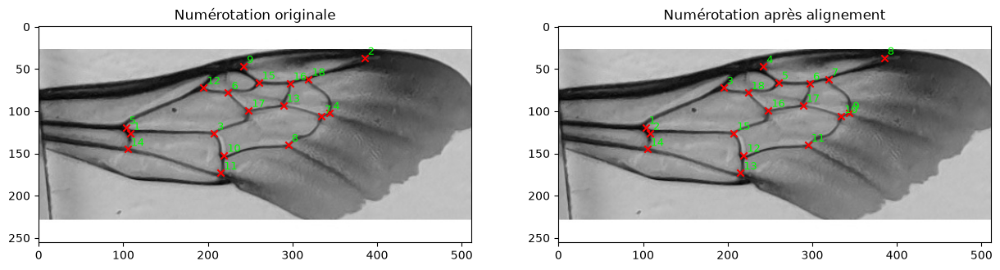

In [247]:
_, axes = plt.subplots(1, 2, figsize=(15, 10))

for i, p in enumerate([points, points[inv]]):
    axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), cmap="gray")
    axes[i].scatter(p[:,1], p[:,0], color="red", marker="x")

    for j, (x, y) in enumerate(p):
        axes[i].annotate(str(j + 1), (y, x), color="lime", fontsize=9, xytext=(3, 3), textcoords="offset points")

    axes[i].set_aspect("equal", adjustable="box")

axes[0].set_title("Numérotation originale")
axes[1].set_title("Numérotation après alignement")
plt.show()

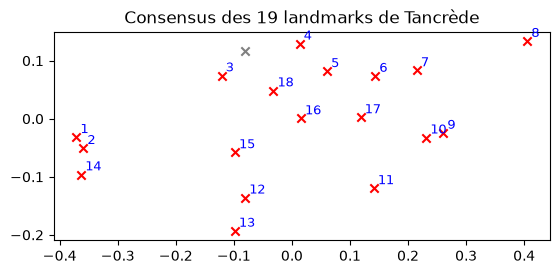

In [239]:
plt.scatter(zones[:,0], zones[:,1], color="red", marker="x")
plt.scatter(consensus[3,0], consensus[3,1], color="grey", marker="x")

for j, (x, y) in enumerate(zones):
    plt.annotate(str(j + 1), (x, y), color="blue", fontsize=9, xytext=(3, 3), textcoords="offset points")

plt.gca().set_aspect("equal", adjustable="box")
plt.title("Consensus des 19 landmarks de Tancrède")
plt.show()

## Outliers

In [67]:
outliers = pd.read_csv(PROJECT_ROOT / 'src' / 'out' / 'lda' / 'terrain' / 'outlier_specimens.csv', index_col=0)
outliers_idx = outliers[outliers.heavy].index

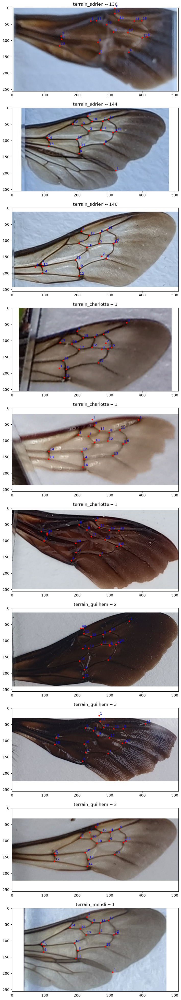

In [68]:
fig, axes = plt.subplots(10, 1, figsize=(10, 50))

for i, idx in enumerate(outliers_idx[:10]):
    d = records[idx]

    img_path = Path(d["image_path"])
    
    image = cv2.imread(img_path)
    landmarks = d["landmarks"]

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,1], landmarks[:,0], 10, 'r')

    for j, (y, x) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")
    
    esp = img_path.parents[1].stem.split("_")[-1]
    cst = img_path.parents[0].stem
    device = Path(img_path).stem.split("_")[-1]
    axes[i].set_title(f"{esp}_{cst} -- {device}")

plt.show()

## Predictions

In [ ]:
# datas = pd.read_csv(PROJECT_ROOT / 'data' / 'annotations' / 'gabriel.csv', index_col=0)
# preds = pd.read_csv(PROJECT_ROOT / 'src' / 'out' / 'lda' / 'organized' / 'predictions.csv', index_col=0)

In [190]:
datas = pd.read_csv(PROJECT_ROOT / 'data' / 'annotations' / 'terrain.csv', index_col=0)
preds = pd.read_csv(PROJECT_ROOT / 'out' / 'lda' / 'terrain' / 'predictions.csv', index_col=0)

In [191]:
X = datas.loc[preds.index, ['espece']]
y = preds.loc[:, ['predicted_espece', 'second_choice']]

In [192]:
comparison = pd.DataFrame({
    'true_espece': X['espece'],
    'predicted_espece': y['predicted_espece'],
    'second_choice': y['second_choice'],
    'top1_match': X['espece'] == y['predicted_espece']
})
comparison['top2_match'] = (comparison['true_espece'] == comparison['predicted_espece']) | \
                           (comparison['true_espece'] == comparison['second_choice'])

print("=== RÉSUMÉ DES PRÉDICTIONS ===")
top1_accuracy = comparison['top1_match'].sum() / len(comparison)
top2_accuracy = comparison['top2_match'].sum() / len(comparison)

print(f"Top-1 Accuracy: {top1_accuracy:.4f} ({top1_accuracy*100:.2f}%)")
print(f"Top-2 Accuracy: {top2_accuracy:.4f} ({top2_accuracy*100:.2f}%)")

print(f"\n=== ERREURS TOP-1 ({(~comparison['top1_match']).sum()} erreurs) ===")
print(comparison[~comparison['top1_match']].head(10))

print(f"\n=== ERREURS TOP-2 ({(~comparison['top2_match']).sum()} erreurs) ===")
print(comparison[~comparison['top2_match']].head(10))

=== RÉSUMÉ DES PRÉDICTIONS ===
Top-1 Accuracy: 0.7381 (73.81%)
Top-2 Accuracy: 0.8413 (84.13%)

=== ERREURS TOP-1 (66 erreurs) ===
                   true_espece predicted_espece second_choice  top1_match  \
id                                                                          
0                    rupestris         confusus     wurflenii       False   
2                     pratorum       lapidarius       pomorum       False   
8                     pratorum        wurflenii     pyrenaeus       False   
10                  lapidarius         confusus     wurflenii       False   
11  sp (wurflenii ou pratorum)         pratorum    ruderarius       False   
12                  lapidarius         sichelii    lapidarius       False   
15                  sylvestris       soroeensis     monticola       False   
18                   mesomelas         sichelii     wurflenii       False   
34                  lapidarius         sichelii    lapidarius       False   
35                  la

In [248]:
specimens = parse_tps('../data/annotations/terrain_reordered.tps')[0]
sample_indices = preds.loc[preds.confidence < 0.6].index

In [203]:
PROJECT_ROOT

PosixPath('/Users/superbg/Documents/Jules/IEES/idmybee')

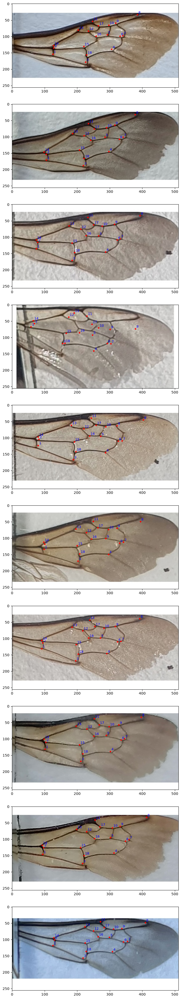

In [249]:
import pathlib

fig, axes = plt.subplots(10, 1, figsize=(10, 50))

for i, idx in enumerate(sample_indices[:10]):
    spec = specimens[idx]
    path = f"{PROJECT_ROOT}/{pathlib.PureWindowsPath(spec.image_path).as_posix()}"
    
    image = cv2.imread(str(path))
    landmarks = spec.landmarks

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,0], landmarks[:,1], 10, 'r')

    for j, (x, y) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")

plt.show()